In [ ]:
!pip install -q tensorflow-probability
!pip install -q imageio
!pip install -q git+https://github.com/tensorflow/docs

import glob
import imageio
import PIL
import os
import tqdm
import time
import sys

import numpy as np
import cv2 as cv
import tensorflow as tf
import tensorflow_probability as tfp

import matplotlib.pyplot as plt
import matplotlib.image as mpimg 

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from IPython import display
from datetime import datetime
from scipy.stats import norm

from keras import backend as K
from keras import metrics
from keras import optimizers
from keras.layers import Input, Dense, Lambda, Flatten, Reshape, Layer
from keras.layers import Input, Conv2D, Flatten, Dense, Conv2DTranspose, Reshape, Lambda, Activation, BatchNormalization, LeakyReLU, Dropout, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint 
from keras.utils import plot_model
from keras.models import Model
from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
from keras.utils import plot_model
from keras.optimizers import Adam

from skimage.transform import resize

from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)
os.chdir('/content/gdrive/My Drive/Momothesis')

Mounted at /content/gdrive


In [ ]:
def image_split(image, chunk = 192, resize = False):
  img_set = []
  for i in range(1, 8):
    for j in range(1, 9):
      if not resize:
        img = image[(i - 1) * chunk : i * chunk, (j - 1) * chunk : j * chunk, :]
      else:
        img = cv.resize(image[(i - 1) * chunk : i * chunk, (j - 1) * chunk : j * chunk, :], (96, 96))
      img_set.append(img)

  return img_set

In [ ]:
directories = ['data/mitos_atypia/training_aperio/', 'data/mitos_atypia/training_hamamatsu/', 'data/mitos_atypia/testing_aperio/', 'data/mitos_atypia/testing_hamamatsu/']
zoom = ['/frames/x10/', '/frames/x20/', '/frames/x40/']

scans_x10 = []
scans_x20 = []
scans_x40 = []

scans_split_x10 = []
scans_split_x20 = []
scans_split_x40 = []

resize_by = 200

We had different ways of approaching data preparation for this proyect:
1. Resize each scan to a 200x200 image, resulting in 4267 images.
2. Dividing each scan in 56 192x192 images, resulting in  238952 images.
3. Combining approach #1 and #2, resizing resulting images in approach #2 to 96x96.

In [ ]:
# @markdown ## **Approach 1**
# @markdown Read all images and resizes them to 200 x 200 x 3
# @markdown Results in 4267 images
# @markdown ~1.2 GB RAM used
# @markdown 58 minutes consumed

for path in directories:
  for folder in os.listdir(path):
    for img in os.listdir(path + folder + zoom[0]): # Takes 3 minutes
      img_cv = cv.cvtColor(cv.imread(path + folder + zoom[0] + img), cv.COLOR_BGR2RGB)
      img_resized = cv.resize(img_cv, (resize_by, resize_by))
      scans_x10.append(img_resized)

    for img in os.listdir(path + folder + zoom[1]): # Takes 10 minutes and 20 seconds
      img_cv = cv.cvtColor(cv.imread(path + folder + zoom[1] + img), cv.COLOR_BGR2RGB)
      img_resized = cv.resize(img_cv, (resize_by, resize_by))
      scans_x20.append(img_resized)
      
    for img in os.listdir(path + folder + zoom[2]): # Takes 44 minutes and 39 seconds
      img_cv = cv.cvtColor(cv.imread(path + folder + zoom[2] + img), cv.COLOR_BGR2RGB)
      img_resized = cv.resize(img_cv, (resize_by, resize_by))
      scans_x40.append(img_resized)

print('x10: ', len(scans_x10),' x20: ',  len(scans_x20),' x40: ', len(scans_x40))

In [ ]:
# @markdown ## **Approach 2**
# @markdown Read all images and split in 192 x 192 x 3
# @markdown Results in 56 images per scan, 238952 images total
# @markdown ALL RAM used
# @markdown FOREVER Time consumed

for path in directories:
  for folder in os.listdir(path):
    for img in os.listdir(path + folder + zoom[0]): # Takes 10 minutes
      scans_split_x10 = scans_split_x10 + image_split(cv.cvtColor(cv.imread(path + folder + zoom[0] + img), cv.COLOR_BGR2RGB))

    for img in os.listdir(path + folder + zoom[1]): # Takes 10 minutes
      scans_split_x20 = scans_split_x20 + image_split(cv.cvtColor(cv.imread(path + folder + zoom[1] + img), cv.COLOR_BGR2RGB))
      
    for img in os.listdir(path + folder + zoom[2]): # Takes 41 minutes and 41 seconds
      scans_split_x40 = scans_split_x40 + image_split(cv.cvtColor(cv.imread(path + folder + zoom[2] + img), cv.COLOR_BGR2RGB))

In [ ]:
scans_all = scans_x10 + scans_x20 + scans_x40

scans_x10 = np.r_[scans_x10]
scans_x20 = np.r_[scans_x20]
scans_x40 = np.r_[scans_x40]
scans_all = np.r_[scans_all]

np.save('data/mitos_atypia/arrays/scans_x10.npy', scans_x10)
np.save('data/mitos_atypia/arrays/scans_x20.npy', scans_x20)
np.save('data/mitos_atypia/arrays/scans_x40.npy', scans_x40)

#Simple CVAE Architecture

In [ ]:
def preprocess_images(images):
  height = images.shape[1]
  width = images.shape[2]
  depth = images.shape[3]
  images = images.reshape((images.shape[0], height, width, 3)) / 255.  
  return images.astype('float32')

In [ ]:
def generate_train_test(array, train_size = 0.8):
  array = np.random.permutation(array)

  train_size = int(len(array) * 0.8)
  test_size = len(array) - train_size

  x_train = array[:train_size]
  x_test = array[train_size:]

  train_images = preprocess_images(x_train)
  test_images = preprocess_images(x_test)

  train_dataset = (tf.data.Dataset.from_tensor_slices(train_images).shuffle(train_size).batch(batch_size))
  test_dataset = (tf.data.Dataset.from_tensor_slices(test_images).shuffle(test_size).batch(batch_size))

  return train_dataset, test_dataset

In [ ]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim, input_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape = (input_dim, input_dim, 1)),
      tf.keras.layers.Conv2D(filters = 32, kernel_size = 3, strides=(2, 2), activation = 'relu'),
      tf.keras.layers.Conv2D(filters = 64, kernel_size = 3, strides=(2, 2), activation = 'relu'),
      tf.keras.layers.Flatten(),
      # No activation
      tf.keras.layers.Dense(latent_dim + latent_dim),
      ])

    self.decoder = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
      tf.keras.layers.Dense(units = int(input_dim / 4) * int(input_dim / 4) * 32, activation = tf.nn.relu),
      tf.keras.layers.Reshape(target_shape=(int(input_dim / 4), int(input_dim / 4), 32)),
      tf.keras.layers.Conv2DTranspose(filters = 64, kernel_size = 3, strides = 2, padding = 'same', activation = 'relu'),
      tf.keras.layers.Conv2DTranspose(filters = 32, kernel_size = 3, strides = 2, padding='same', activation = 'relu'),
      # No activation
      tf.keras.layers.Conv2DTranspose(filters = 1, kernel_size = 3, strides = 1, padding = 'same'),
    ])

  @tf.function
  def sample(self, eps = None):
    if eps is None:
      eps = tf.random.normal(shape = (100, self.latent_dim))
    return self.decode(eps, apply_sigmoid = True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits = 2, axis = 1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape = mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs
    return logits

In [ ]:
optimizer = tf.keras.optimizers.Adam(1e-4)

def log_normal_pdf(sample, mean, logvar, raxis = 1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(-.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi), axis=raxis)

def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits = x_logit, labels = x)
  logpx_z = -tf.reduce_sum(cross_ent, axis = [1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)


@tf.function
def train_step(model, x, optimizer):
  """Executes one training step and returns the loss.

  This function computes the loss and gradients, and uses the latter to
  update the model's parameters.
  """
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [ ]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow(predictions[i, :, :, 0], cmap='gray')
    plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()
  
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

def plot_latent_images(model, n, digit_size):
  """Plots n x n digit images decoded from the latent space."""

  norm = tfp.distributions.Normal(0, 1)
  grid_x = norm.quantile(np.linspace(0.05, 0.95, n))
  grid_y = norm.quantile(np.linspace(0.05, 0.95, n))
  image_width = digit_size*n
  image_height = image_width
  image = np.zeros((image_height, image_width))

  for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
      z = np.array([[xi, yi]])
      x_decoded = model.sample(z)
      digit = tf.reshape(x_decoded[0], (digit_size, digit_size))
      image[i * digit_size: (i + 1) * digit_size,
            j * digit_size: (j + 1) * digit_size] = digit.numpy()

  plt.figure(figsize=(10, 10))
  plt.imshow(image, cmap='Greys_r')
  plt.axis('Off')
  plt.show()

# Simple CVAE (x10 SPLIT 11312x192x192x1)

In [ ]:
s10_res = np.load('data/mitos_atypia/arrays/scans_split_x10.npy')
s10_res = list(s10_res)
for i, img in enumerate(s10_res):
  s10_res[i] = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
s10_res = np.r_[s10_res]

In [ ]:
batch_size = 32
epochs = 60
latent_dim = 2
num_examples_to_generate = 16
# set the dimensionality of the latent space to a plane for visualization later
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim, 192)
train_dataset, test_dataset = generate_train_test(s10_res, 0.9)

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

Epoch: 60, Test set ELBO: -23403.25, time elapse for current epoch: 35.19719409942627


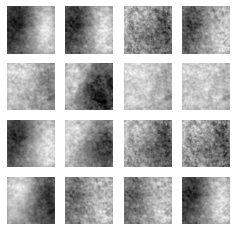

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

(-0.5, 287.5, 287.5, -0.5)

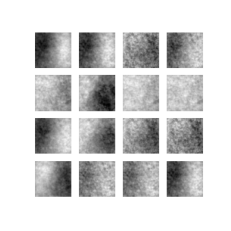

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


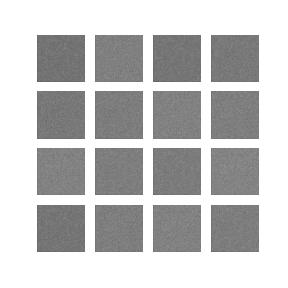

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

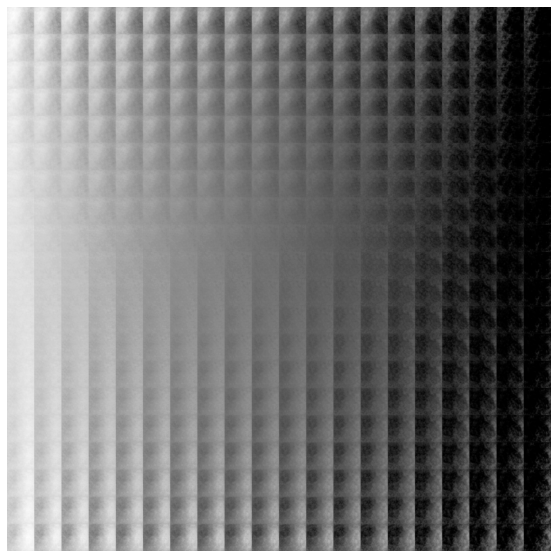

In [ ]:
plot_latent_images(model, 20, 192)

# Simple CVAE (x20 SPLIT 20000x192x192x1)

In [ ]:
s20_split = np.load('data/mitos_atypia/arrays/scans_split_x20_grays.npy')
s20_split = s20_split[:20000]

In [ ]:
batch_size = 32
epochs = 60
latent_dim = 2
num_examples_to_generate = 16
# set the dimensionality of the latent space to a plane for visualization later
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim, 192)
train_dataset, test_dataset = generate_train_test(s20_split, 0.9)

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

Epoch: 10, Test set ELBO: -21959.21484375, time elapse for current epoch: 58.63017439842224


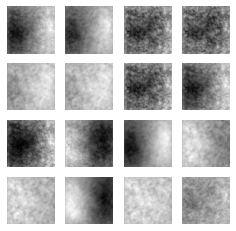

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

(-0.5, 287.5, 287.5, -0.5)

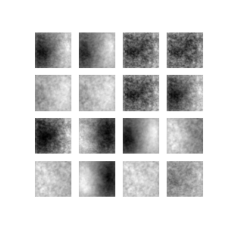

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


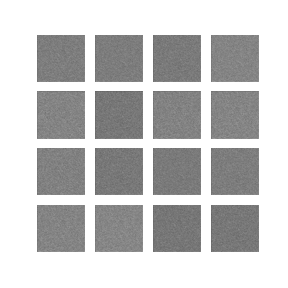

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

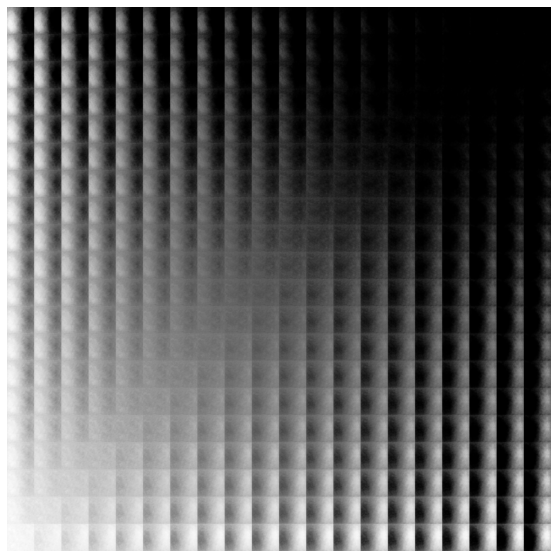

In [ ]:
plot_latent_images(model, 20, s20_res[0][1])

# Simple CVAE (ALL RESIZED 4267x200x200x1)

In [ ]:
scans_x10 = np.load('data/mitos_atypia/arrays/scans_x10.npy')
scans_x20 = np.load('data/mitos_atypia/arrays/scans_x20.npy')
scans_x40 = np.load('data/mitos_atypia/arrays/scans_x40.npy')

scans_x10 = list(scans_x10)
scans_x20 = list(scans_x20)
scans_x40 = list(scans_x40)

scans_all = scans_x10 + scans_x20 + scans_x40

for i, img in enumerate(scans_all):
  scans_all[i] = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
scans_all = np.r_[scans_all]

In [ ]:
batch_size = 32
epochs = 10
latent_dim = 2
num_examples_to_generate = 16
# set the dimensionality of the latent space to a plane for visualization later
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim, 200)
train_dataset, test_dataset = generate_train_test(scans_all, 0.9)

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

Epoch: 10, Test set ELBO: -25498.44140625, time elapse for current epoch: 14.394585609436035


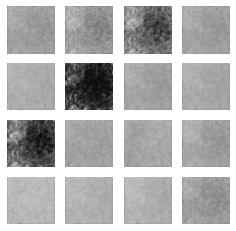

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

(-0.5, 287.5, 287.5, -0.5)

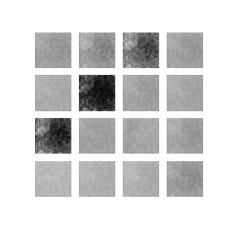

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


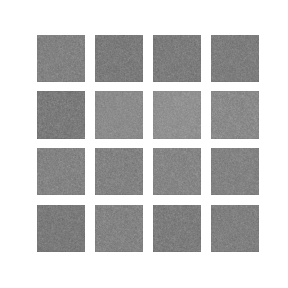

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [ ]:
plot_latent_images(model, 20, 200)

# Simple CVAE (x10 SPLIT RESIZED 11312x96x96x1)

In [ ]:
s10_split_res = np.load('data/mitos_atypia/arrays/scans_split_x10.npy')
s10_split_res = list(s10_split_res)

for i, img in enumerate(s10_split_res):
  s10_split_res[i] = cv.resize(cv.cvtColor(img, cv.COLOR_RGB2GRAY), (96, 96))
s10_split_res = np.r_[s10_split_res]

In [ ]:
batch_size = 32
epochs = 60
latent_dim = 2
num_examples_to_generate = 16
# set the dimensionality of the latent space to a plane for visualization later
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim, 96)
train_dataset, test_dataset = generate_train_test(s10_split_res, 0.9)

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

Epoch: 60, Test set ELBO: -5860.55029296875, time elapse for current epoch: 4.064961194992065


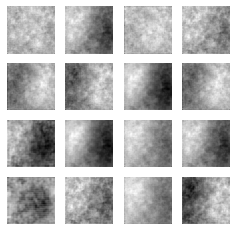

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

(-0.5, 287.5, 287.5, -0.5)

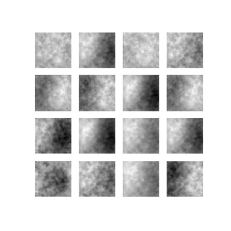

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


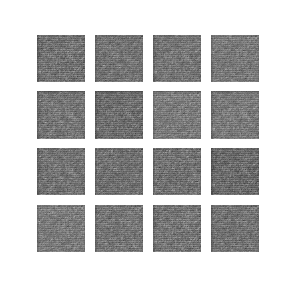

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [ ]:
plot_latent_images(model, 60, 96)

# Simple CVAE (x20 SPLIT RESIZED 46592x96x96x1)

In [ ]:
s20_split_res = np.load('data/mitos_atypia/arrays/scans_split_x20_resized.npy')
s20_split_res = list(s20_split_res)

for i, img in enumerate(s20_split_res):
  s20_split_res[i] = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
s20_split_res = np.r_[s20_split_res]

In [ ]:
batch_size = 32
epochs = 60
latent_dim = 2
num_examples_to_generate = 16
# set the dimensionality of the latent space to a plane for visualization later
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim, 96)
train_dataset, test_dataset = generate_train_test(s20_split_res, 0.9)

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

Epoch: 60, Test set ELBO: -5845.60498046875, time elapse for current epoch: 17.05907416343689


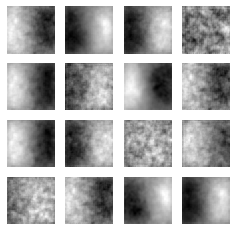

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

(-0.5, 287.5, 287.5, -0.5)

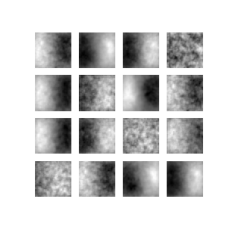

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


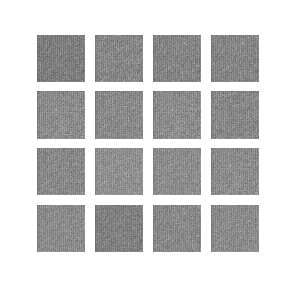

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

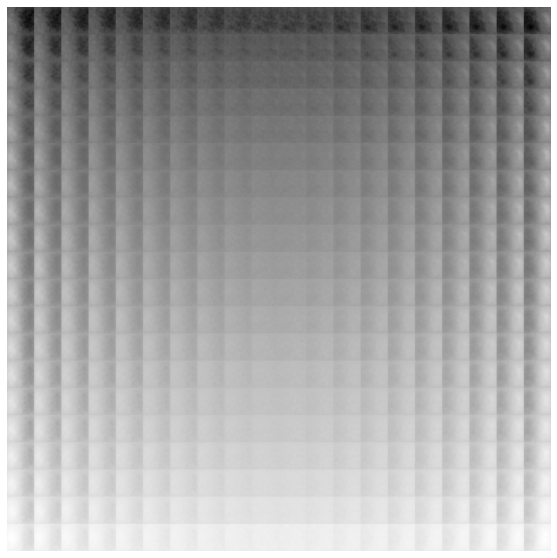

In [ ]:
plot_latent_images(model, 20, 96)

# Color CVAE Architecture

In [ ]:
latent_dim = 16

In [ ]:
class CCVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim, input_dim):
    super(CCVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape = (input_dim, input_dim, 3)), 
      tf.keras.layers.Conv2D(filters = 32, kernel_size = 3, activation = 'relu'),
      tf.keras.layers.Conv2D(filters = 64, kernel_size = 3, activation = 'relu'),
      tf.keras.layers.Flatten(),
      # No activation
      tf.keras.layers.Dense(latent_dim + latent_dim),
      ])

    self.decoder = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
      tf.keras.layers.Dense(units = int(input_dim) * int(input_dim) * 96, activation = tf.nn.relu),
      tf.keras.layers.Reshape(target_shape=(int(input_dim), int(input_dim), 3, 32)),
      tf.keras.layers.Conv3DTranspose(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'),
      tf.keras.layers.Conv3DTranspose(filters = 32, kernel_size = 3, padding='same', activation = 'relu'),
      # No activation
      tf.keras.layers.Conv3DTranspose(filters = 1, kernel_size = 3, padding = 'same'),
    ])

  @tf.function
  def sample(self, eps = None):
    if eps is None:
      eps = tf.random.normal(shape = (100, self.latent_dim))
    return self.decode(eps, apply_sigmoid = True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits = 2, axis = 1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape = mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs
    return logits

In [ ]:
batch_size = 32
epochs = 60
latent_dim = 2
num_examples_to_generate = 16
# set the dimensionality of the latent space to a plane for visualization later
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(shape=[num_examples_to_generate, latent_dim])
model = CCVAE(16, 96)
train_dataset, test_dataset = generate_train_test(s20_res[0:20000], 0.7)

In [ ]:
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

TypeError: ignored

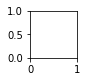

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in test_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

In [ ]:
s20_res = np.load('data/mitos_atypia/arrays/scans_split_x20_resized.npy')

In [ ]:
s20_res = s20_res.astype('float32') / 255